Lab Two: Exploring Image Data

ML in Python, Fall 2023

Authors: Ethan Haugen, Will Goodgame, Duke Bartholomew

In [1]:
#Somewhat random imports used across the notebook
import numpy as np
import matplotlib.pyplot as plt
import copy
from IPython.display import display, Image
from PIL import Image
from ipywidgets import widgets

#Plotly imports for graphs
import plotly
from plotly.graph_objs import Bar, Line
from plotly.graph_objs import Scatter, Layout
from plotly.graph_objs.scatter import Marker
from plotly.graph_objs.layout import XAxis, YAxis

#Sklearn imports for PCA, DAISY, and KNearestNeighbors
from sklearn.decomposition import PCA
from skimage.feature import daisy
from skimage.io import imshow
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import pairwise_distances

#Torch imports for the CNN
import torch
from torchvision.utils import make_grid
import torch.utils.data as data
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import os
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import random_split
from torch.utils.data.dataloader import DataLoader

###Business Understanding

Add Business understanding, make sure to talk about HOW this is useful to people and specifically why classifying weather images could be important and to WHOM

###Data Preparation

####Reading in the data

Firstly, we need to import the data into two arrays, one for images and another for the labels.

In [2]:
data_dir = r"..\Weather-Conditions-Classification\data\Multi-class Weather Dataset"
filepaths = []
labels = []

#Traverses the directories and appends the data to lists
folds = os.listdir(data_dir)
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

#convert lists to numpy arrays
filepaths_array = np.array(filepaths)
labels_array = np.array(labels)

print("First File Path:")
print(filepaths_array[0])
print("First Label:")
print(labels_array[0])

First File Path:
..\Weather-Conditions-Classification\data\Multi-class Weather Dataset\Cloudy\cloudy1.jpg
First Label:
Cloudy


####Data Preprocessing

At this point we have a numpy array containing all of our image paths. We then loop through this array to create 2 new arrays: one for principal component analysis (PCA), one for printing examples. Both arrays are grayscaled and converted from Pillow images to numpy arrays, although the PCA version also flattens them to 1D arrays and normalizes the values of each pixel between 0 and 1.

In [3]:
resized_images_PCA = []
resized_images_print = []

def show_image(img):
    print("File Path:", filepaths_array[i])
    plt.imshow(img, cmap='gray')
    plt.title(f"Label: {labels_array[i]}")
    plt.axis('off')
    plt.show()

def load_and_process_image(file_path):
    size = (200,200)
    image = Image.open(file_path)
    resized_image = image.resize(size)
    return resized_image

def grayscale_image(image):
    gray_image = image.convert("L")
    return gray_image

for i in range(len(filepaths_array)):
    image = load_and_process_image(filepaths_array[i])
    grayscaled_image = grayscale_image(image)
    resized_image_array_PCA = np.array(grayscaled_image).flatten()
    resized_image_array_PCA = resized_image_array_PCA.astype(np.float32)/255.0
    resized_images_PCA.append(resized_image_array_PCA)

    resized_image_array_print = np.array(grayscaled_image)
    resized_images_print.append(resized_image_array_print)

resized_images_array_PCA = np.array(resized_images_PCA)
resized_images_array_print = np.array(resized_images_print)

Below are 10 examples of the grayscaled images with their corresponding labels.

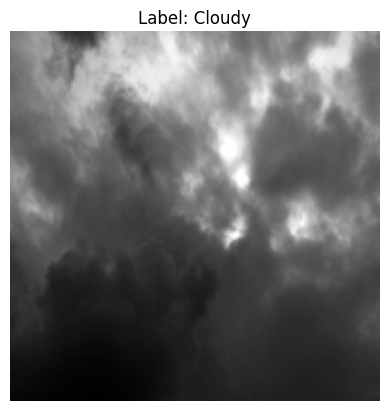

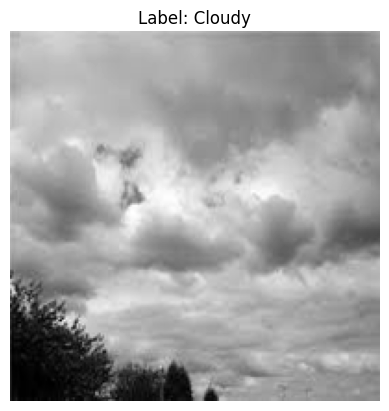

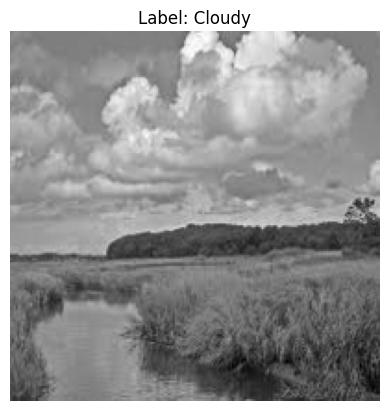

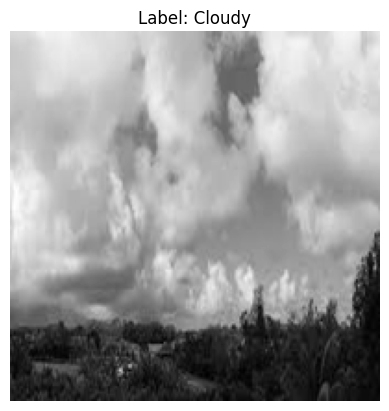

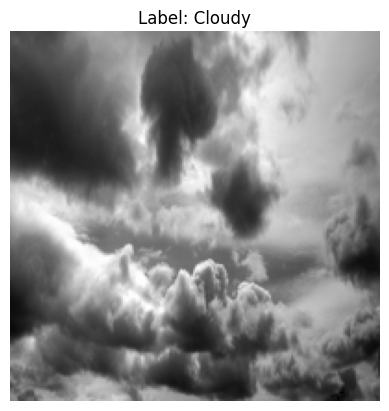

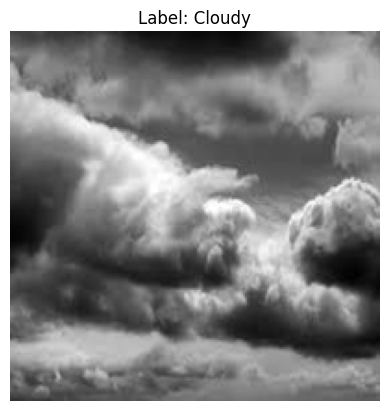

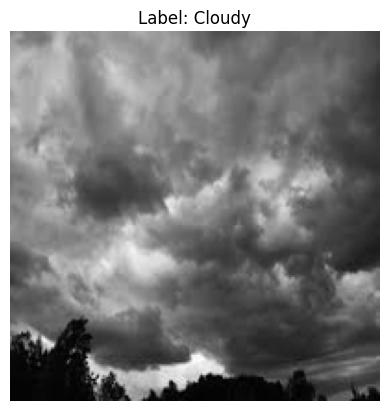

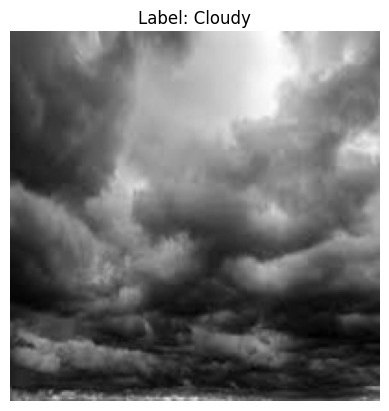

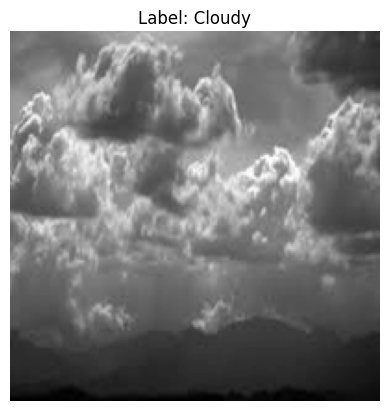

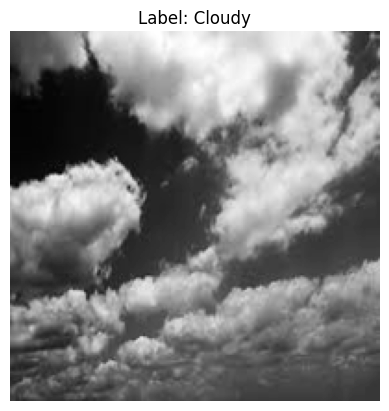

In [4]:
for i in range(10):
    img = resized_images_print[i]
    plt.imshow(img, cmap='gray')
    plt.title(f"Label: {labels_array[i]}")
    plt.axis('off')
    plt.show()

We can also see based on our output below that the PCA array is properly flattened, and the array contains 1125 "images" that are single rows of 40,000 data points (converted from 200x200 images).

In [5]:
X = resized_images_array_PCA
#Ensure that the PCA version is properly flattened
print(resized_images_array_PCA.shape)

#Grabbing the original dimensions of our data
n_samples, h, w = resized_images_array_print.shape

(1125, 40000)


###Data Reduction

Because we are examining a dataset of 1,125 200x200 images, we have a whopping 45,000,000 data points in the entire set (1125x200x200). We wouldn't want to reduce the size of our images below 200x200 for fear of removing important detail, so instead we can use principal component analysis to extract the eigenvectors that contribute the vast majority of the explained variance.

In [6]:
#Perform PCA for 300 components, extracting the top 300
n_components = 300
print ("Extracting the top %d eigenimages from %d weather images" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenweather = pca.components_.reshape((n_components, h, w))

Extracting the top 300 eigenimages from 1125 weather images
CPU times: total: 12.1 s
Wall time: 3.82 s


Below are two graphs showing the individual explained variance and cumulative explained variance of the top 10 eigenvectors versus the top 300 eigenvectors. In the first graph (Fig INSERT), we see that one eigenvector accounts for 32% of the explained variance, while ten eigenvectors gets us to an impressive 75% explained variance. The larger graph (Fig INSERT) shows that using the top 300 eigenvectors can represent an impressive 97% of the explained variance from the entire dataset. We will use 300 dimensions for our analysis since we'd like to maintain most of the explained variance, while still eliminating a ton of data that contributes little meaning. 

In [7]:
#Helper function to show the cumulative explained variance 
#for the components
def plot_explained_variance(pca):
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })

pca_10 = PCA(n_components=10, svd_solver='full')
X_pca = pca_10.fit(X)
plot_explained_variance(pca_10)
   

pca_300 = PCA(n_components=300, svd_solver='full')
X_pca = pca_300.fit(X)
plot_explained_variance(pca_300)

Below (Fig INSERT) are the first 18 eigenvectors constructed from the PCA

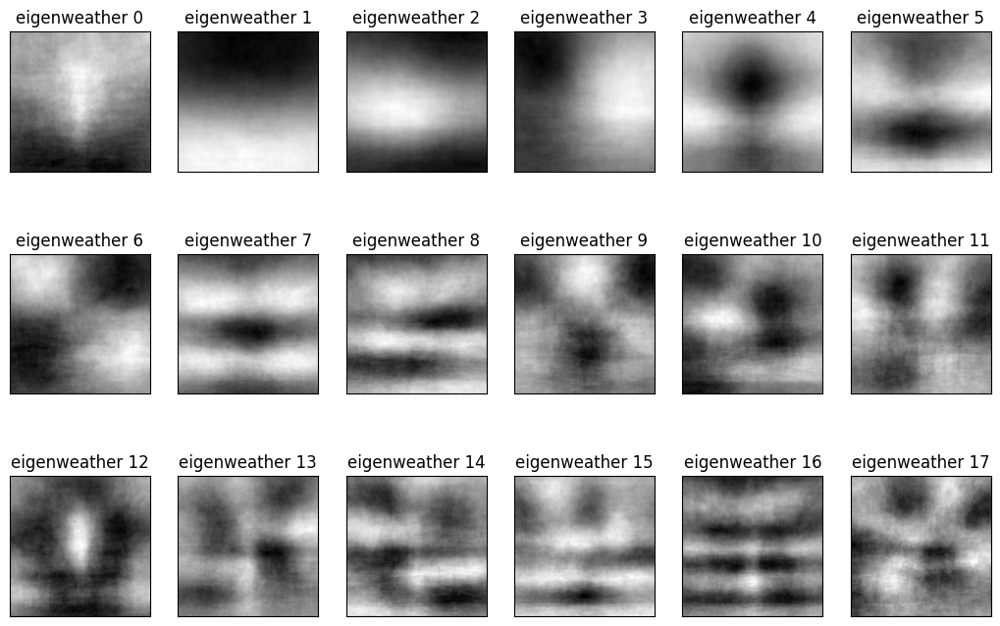

In [8]:
# a helper plotting function
def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

eigenweather_titles = ["eigenweather %d" % i for i in range(eigenweather.shape[0])]
plot_gallery(eigenweather, eigenweather_titles, h, w)

The 300 "eigenweathers" can now be used to reconsruct any image from the dataset while accounting for 97% of the variance, allowing the reconstruction to be incredibly accurate.

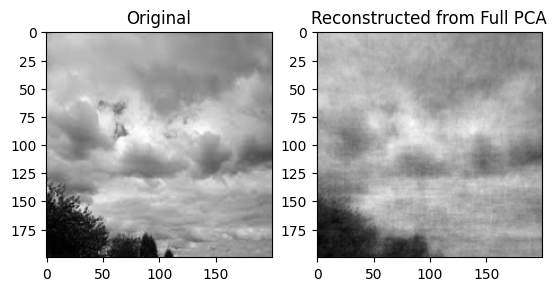

In [9]:
#Code to reconstruct an image from the PCA
def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image
    
idx_to_reconstruct = 1    
X_idx = X[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca_300,X_idx.reshape(1, -1))

#Plotting code
plt.subplot(1,2,1)
plt.imshow(X_idx.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)

### Randomized PCA

I don't understand the difference between randomized and full PCA, but we should probably talk about that INSERT.

Interestingly, using randomized PCA seems to give the same eigenvectors accounting for the same explained variance as full PCA.

In [10]:
# lets do some PCA of the features and go from 1125 features to 300 features
n_components = 300
print ("Extracting the top %d eigenweathers from %d weather images" % (
    n_components, X.shape[0]))

#Using svd_solver='randomized' makes our PCA randomized
rpca_10 = PCA(n_components=10, svd_solver='randomized')
%time rpca_10.fit(X.copy())
plot_explained_variance(rpca_10)

rpca_300 = PCA(n_components=n_components, svd_solver='randomized')
%time rpca_300.fit(X.copy())
eigenweathers = rpca_300.components_.reshape((n_components, h, w))

plot_explained_variance(rpca_300)

Extracting the top 300 eigenweathers from 1125 weather images
CPU times: total: 5.59 s
Wall time: 1.99 s


CPU times: total: 13.8 s
Wall time: 5.42 s


The following widget visualizes any image in the dataset alongside it's reconstructed versions from both randomized and full PCA, using either 10 or 300 components (Fig INSERT). The differences between PCA and randomized PCA, even using only 10 elements, is miniscule. Based on this analysis we do not prefer one method over the other.

In [11]:

def plt_reconstruct(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    x_flat = X[idx_to_reconstruct].reshape(1, -1)
    reconstructed_image_300 = pca_300.inverse_transform(pca_300.transform(x_flat.copy()))    
    reconstructed_image_rpca_300 = rpca_300.inverse_transform(rpca_300.transform(x_flat.copy()))

    reconstructed_image_10 = pca_10.inverse_transform(pca_10.transform(x_flat.copy()))    
    reconstructed_image_rpca_10 = rpca_10.inverse_transform(rpca_10.transform(x_flat.copy()))
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(2,3,1) # original
    plt.imshow(x_flat.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(labels_array[idx_to_reconstruct]+f", {x_flat.shape[1]} elements")
    plt.grid(False)
    
    plt.subplot(2,3,2) # pca 300
    plt.imshow(reconstructed_image_300.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Full PCA, {n_components} elements")
    plt.grid(False)
    
    plt.subplot(2,3,3) # randomized pca 300
    plt.imshow(reconstructed_image_rpca_300.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Randomized PCA, {n_components} elements")
    plt.grid(False)

    plt.subplot(2,3,4) # pca 10
    plt.imshow(reconstructed_image_10.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Full PCA, {10} elements")
    plt.grid(False)
    
    plt.subplot(2,3,5) # randomized pca 10
    plt.imshow(reconstructed_image_rpca_10.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Randomized PCA, {10} elements")
    plt.grid(False)
    
    
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

interactive(children=(IntSlider(value=562, description='idx_to_reconstruct', max=1124), Output()), _dom_classe…

<function __main__.plt_reconstruct(idx_to_reconstruct)>

### Feature Extraction Using DAISY

INSERT brief explanation of DAISY, maybe what we expect to happen or how we will use it. Also maybe talk about how fast it is for feature extraction.

In [12]:
# now let's understand how to use it
features = daisy(img, step=20, radius=20, rings=2, histograms=8, orientations=4, visualize=False)
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

(8, 8, 68)
4352


In [13]:
# create a function to take in the row of the matrix and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=20, radius=20, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(X[3],(h,w))
test_feature.shape

CPU times: total: 0 ns
Wall time: 32.1 ms


(4352,)

In [14]:
# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

CPU times: total: 12.5 s
Wall time: 28 s
(1125, 4352)


In [15]:
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

CPU times: total: 78.1 ms
Wall time: 162 ms


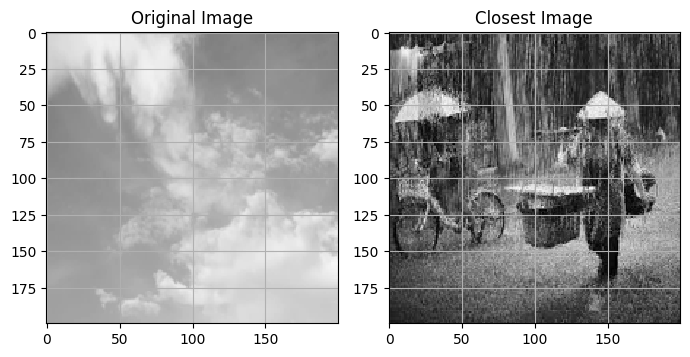

In [16]:
# find closest image to current image
idx1 = 30
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

Daisy is completely worthless for weather analysis because orientation isn't relevant. (Expand on this thought). INSERT

### K-Nearest Neighbors Classification

INSERT explanation on K-nearest neighbors

In [17]:
# Sample data (replace with your own data)
full_data_X = resized_images_array_PCA
y = labels_array

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a K-Nearest Neighbors classifier
knn_classifier = KNeighborsClassifier(n_neighbors=4)  # You can adjust 'n_neighbors' as needed

# Fit the classifier to the training data
knn_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = knn_classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.6311111111111111


Considering that guessing at random should net an accuracy score of 25% (4 possible categories for the data), K-nearest neighbors classification was a success having a 63% accuracy score.

### Exceptional Work: Using a Convulutional Neural Network for better classification

Although the 63% accuracy netted from K-nearest neighbors classification is a massive improvement over random guessing, that level of accuracy wouldn't be incredibly useful to stakeholders invested in image classification technology (INSERT: reference business understanding). A Convolutional Neural Network (CNN) is a deep learning model designed to automatically and hierarchically learn relevant features from input data by using convolutional layers to detect patterns and learn representations. By using a convolutional neural network, we can hopefully achieve greater accuracy. 

INSERT: reference to the site where I found most of the code

In [18]:
if torch.cuda.is_available():
    print("GPU is available.")
else:
    print("GPU is not available. Training on CPU.")

torch.cuda.empty_cache()   
torch.cuda.memory_allocated() 

GPU is available.


0

In [19]:
#train and test data directory
data_dir = "./data/Multi-class Weather Dataset"

#load the train and test data
dataset = ImageFolder(data_dir,transform = transforms.Compose([
    transforms.Resize((150,150)),transforms.ToTensor()
]))

# Define the total size of your dataset
total_size = len(dataset)

# Define the sizes for the training and testing subsets
train_size = int(0.8 * total_size)  # 80% of the data for training
test_size = total_size - train_size  # Remaining 20% for testing

# Use random_split to split the dataset into training and testing subsets
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

In [20]:
img, label = dataset[0]
print(img.shape,label)
print("Follwing classes are there : \n",dataset.classes)

torch.Size([3, 150, 150]) 0
Follwing classes are there : 
 ['Cloudy', 'Rain', 'Shine', 'Sunrise']


In [21]:
batch_size = 16
val_size = int(.2*len(train_dataset))
train_size = len(train_dataset) - val_size 
train_data,val_data = random_split(train_dataset,[train_size,val_size])
print(f"Length of Train Data : {len(train_data)}")
print(f"Length of Validation Data : {len(val_data)}")

#load the train and validation into batches.
train_dl = DataLoader(train_data, batch_size, shuffle = True, num_workers = 4, pin_memory = True)
val_dl = DataLoader(val_data, batch_size*2, num_workers = 4, pin_memory = True)
test_dl = DataLoader(test_dataset, batch_size*2,num_workers=4, pin_memory=True)

Length of Train Data : 720
Length of Validation Data : 180


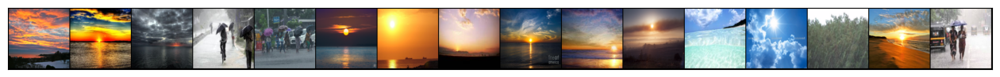

In [22]:
def show_batch(dl):
    """Plot images grid of single batch"""
    for images, labels in dl:
        fig,ax = plt.subplots(figsize = (16,12))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images,nrow=16).permute(1,2,0))
        break
        
show_batch(train_dl)

In [23]:
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))
        
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [24]:
class NaturalSceneClassification(ImageClassificationBase):
    
    def __init__(self):
        
        super().__init__()
        self.network = nn.Sequential(
            
            nn.Conv2d(3, 32, kernel_size = 3, padding = 1),
            nn.ReLU(),
            nn.Conv2d(32,64, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),
        
            nn.Conv2d(64, 128, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.Conv2d(128 ,128, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),

            nn.Conv2d(128, 256, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.Conv2d(256,256, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),
            
            nn.Flatten(),
            nn.Linear(82944,1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512,6)
        )
    
    def forward(self, xb):
        return self.network(xb)

In [25]:
model = NaturalSceneClassification()
model
torch.cuda.empty_cache()
torch.cuda.memory_allocated()

0

In [26]:
for images, labels in train_dl:
    print('images.shape:', images.shape)
    out = model(images)
    print('out.shape:', out.shape)
    print('out[0]:', out[0])
    break

images.shape: torch.Size([16, 3, 150, 150])
out.shape: torch.Size([16, 6])
out[0]: tensor([-0.0289,  0.0042,  0.0097,  0.0434,  0.0476, -0.0194],
       grad_fn=<SelectBackward0>)


In [27]:
def get_default_device():
    """ Set Device to GPU or CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    

def to_device(data, device):
    "Move data to the device"
    if isinstance(data,(list,tuple)):
        return [to_device(x,device) for x in data]
    return data.to(device,non_blocking = True)

class DeviceDataLoader():
    """ Wrap a dataloader to move data to a device """
    
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
    
    def __iter__(self):
        """ Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b,self.device)
            
    def __len__(self):
        """ Number of batches """
        return len(self.dl)

In [28]:
device = get_default_device()
device

device(type='cuda')

In [29]:
# load the into GPU
train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
to_device(model, device)

NaturalSceneClassification(
  (network): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU()
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Flatten(start_dim=1, end_dim=-1)
    (16): Linear(in_features=82944, out_features=1024, bias=True)
    (17): ReLU()
    (18): Li

In [30]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def fit(epochs, lr, model, train_loader, val_loader, opt_func = torch.optim.SGD):
    
    history = []
    optimizer = opt_func(model.parameters(),lr)
    for epoch in range(epochs):
        
        model.train()
        train_losses = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        model.epoch_end(epoch, result)
        history.append(result)
    
    return history

In [31]:
#load the model to the device
model = to_device(NaturalSceneClassification(),device)

In [32]:
#initial evaluation of the model
evaluate(model,val_dl)

{'val_loss': 1.8055915832519531, 'val_acc': 0.0}

In [33]:
#set the no. of epochs, optimizer funtion and learning rate
num_epochs = 20
opt_func = torch.optim.Adam
lr = 0.001
torch.cuda.memory_allocated()

701239296

In [34]:
#fitting the model on training data and record the result after each epoch
history = fit(num_epochs, lr, model, train_dl, val_dl, opt_func)

Epoch [0], train_loss: 1.5080, val_loss: 1.2006, val_acc: 0.4333
Epoch [1], train_loss: 0.8841, val_loss: 0.8283, val_acc: 0.5677
Epoch [2], train_loss: 0.7224, val_loss: 0.6567, val_acc: 0.6708
Epoch [3], train_loss: 0.6097, val_loss: 0.6137, val_acc: 0.7625
Epoch [4], train_loss: 0.5221, val_loss: 0.5430, val_acc: 0.7906
Epoch [5], train_loss: 0.4669, val_loss: 0.4664, val_acc: 0.8125
Epoch [6], train_loss: 0.4662, val_loss: 0.5263, val_acc: 0.7927
Epoch [7], train_loss: 0.3934, val_loss: 0.4569, val_acc: 0.8125
Epoch [8], train_loss: 0.4208, val_loss: 0.4658, val_acc: 0.8240
Epoch [9], train_loss: 0.3619, val_loss: 0.4913, val_acc: 0.8031
Epoch [10], train_loss: 0.3199, val_loss: 0.4362, val_acc: 0.8104
Epoch [11], train_loss: 0.2698, val_loss: 0.5046, val_acc: 0.8219
Epoch [12], train_loss: 0.2417, val_loss: 0.6039, val_acc: 0.7562
Epoch [13], train_loss: 0.3018, val_loss: 0.5080, val_acc: 0.8187
Epoch [14], train_loss: 0.2852, val_loss: 0.5972, val_acc: 0.8219
Epoch [15], train_lo

After training for 30 epochs, the model was able to net ~80% accuracy on the testing data, a huge improvement over K-nearest neighbors! Fig INSERT shows the accuracy over training, which seems to level off after about 10 epochs. 

Figure INSERT shows the training and validation loss over the 30 epochs, which reveals some interesting information. After about 15 epochs, the validation loss levels off while the training loss continues to decrease. This suggests that we are overfitting the model to the training data and likely wouldn't see an accuracy increase by continuing training in this design.

Some potential avenues to continue to increase our accuracy score would be to implement data augmentation techniques, analyze a larger dataset, and tweak the model's architecture and parameters.

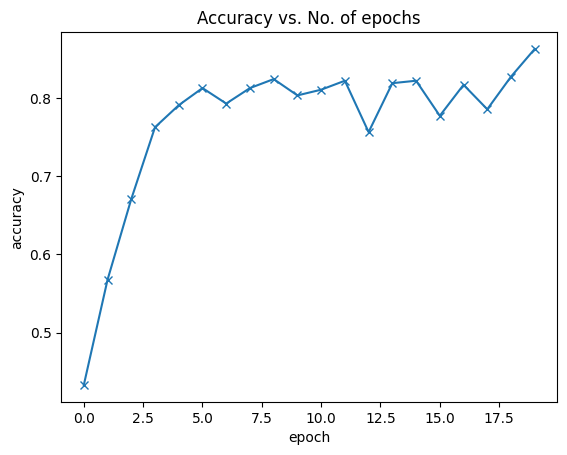

In [35]:
def plot_accuracies(history):
    """ Plot the history of accuracies"""
    accuracies = [x['val_acc'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs')
    

plot_accuracies(history)

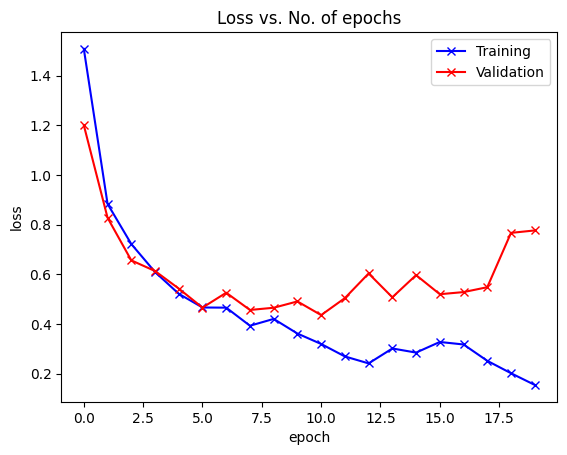

In [36]:
def plot_losses(history):
    """ Plot the losses in each epoch"""
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs')

plot_losses(history)

In [42]:
def test_model(model, test_dl):

    # Set the model to evaluation mode
    model.eval()

    # Initialize variables to keep track of correct predictions and total samples
    correct = 0
    total = 0

    # Disable gradient calculation for inference
    with torch.no_grad():
        for images, labels in test_dl:  # Iterate through test data loader
            #move data to CUDA
            images, labels = images.to('cuda'), labels.to('cuda')

            # Forward pass to get predictions
            outputs = model(images)
            
            # Get the predicted class (the class with the highest probability)
            _, predicted = torch.max(outputs, 1)
            
            # Update total number of samples
            total += labels.size(0)
            
            # Update number of correct predictions
            correct += (predicted == labels).sum().item()

    # Calculate accuracy
    accuracy = (correct / total) * 100.0
    print(f"Test Accuracy: {accuracy:.2f}%")

In [51]:
test_model(model, test_dl)

#save the model
torch.save(model, 'new_cnn_20_epochs.pth')

Test Accuracy: 84.44%


We got 84.44% accuracy on the unseen data! We saved the model at this stage, and the code below can be used to load it at this point without having to train it

In [43]:
test_saved_model = torch.load('new_cnn_20_epochs.pth')


Test Accuracy: 84.44%


### Transfer Learning with ResNet pretrained models

In [44]:
import torchvision.models as models
net = models.resnet18(pretrained=True)
net = net.cuda() if device else net
net

c:\Users\ethan\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

c:\Users\ethan\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.



ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [45]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.0001, momentum=0.9)

def accuracy(out, labels):
    _,pred = torch.max(out, dim=1)
    return torch.sum(pred==labels).item()

num_ftrs = net.fc.in_features
net.fc = nn.Linear(num_ftrs, 128)
net.fc = net.fc.cuda()

In [46]:
test_model(net, test_dl=test_dl)

Test Accuracy: 0.89%


In [52]:
n_epochs = 5
print_every = 10
valid_loss_min = np.Inf
val_loss = []
val_acc = []
train_loss = []
train_acc = []
total_step = len(train_dl)
net.train()
for epoch in range(1, n_epochs+1):
    running_loss = 0.0
    correct = 0
    total=0
    print(f'Epoch {epoch}\n')
    for batch_idx, (data_, target_) in enumerate(train_dl):
        data_, target_ = data_.to(device), target_.to(device)
        optimizer.zero_grad()
        
        outputs = net(data_)
        loss = criterion(outputs, target_)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _,pred = torch.max(outputs, dim=1)
        correct += torch.sum(pred==target_).item()
        total += target_.size(0)
        if (batch_idx) % 20 == 0:
            print ('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}' 
                   .format(epoch, n_epochs, batch_idx, total_step, loss.item()))
    train_acc.append(100 * correct / total)
    train_loss.append(running_loss/total_step)
    print(f'\ntrain-loss: {np.mean(train_loss):.4f}, train-acc: {(100 * correct/total):.4f}')
    batch_loss = 0
    total_t=0
    correct_t=0
    with torch.no_grad():
        net.eval()
        for data_t, target_t in (test_dl):
            data_t, target_t = data_t.to(device), target_t.to(device)
            outputs_t = net(data_t)
            loss_t = criterion(outputs_t, target_t)
            batch_loss += loss_t.item()
            _,pred_t = torch.max(outputs_t, dim=1)
            correct_t += torch.sum(pred_t==target_t).item()
            total_t += target_t.size(0)
        val_acc.append(100 * correct_t/total_t)
        val_loss.append(batch_loss/len(test_dl))
        network_learned = batch_loss < valid_loss_min
        print(f'validation loss: {np.mean(val_loss):.4f}, validation acc: {(100 * correct_t/total_t):.4f}\n')

        
        if network_learned:
            valid_loss_min = batch_loss
            torch.save(net.state_dict(), 'resnet.pt')
            print('Improvement-Detected, save-model')
    net.train()

Epoch 1

Epoch [1/5], Step [0/45], Loss: 1.1516
Epoch [1/5], Step [20/45], Loss: 1.3829
Epoch [1/5], Step [40/45], Loss: 1.8227

train-loss: 1.1948, train-acc: 92.7778
validation loss: 0.8648, validation acc: 96.8889

Improvement-Detected, save-model
Epoch 2

Epoch [2/5], Step [0/45], Loss: 1.2662
Epoch [2/5], Step [20/45], Loss: 0.7557
Epoch [2/5], Step [40/45], Loss: 0.7495

train-loss: 1.1009, train-acc: 94.4444
validation loss: 0.8049, validation acc: 97.3333

Improvement-Detected, save-model
Epoch 3

Epoch [3/5], Step [0/45], Loss: 0.7950
Epoch [3/5], Step [20/45], Loss: 0.8074
Epoch [3/5], Step [40/45], Loss: 1.0935

train-loss: 1.0556, train-acc: 94.7222
validation loss: 0.7546, validation acc: 97.3333

Improvement-Detected, save-model
Epoch 4

Epoch [4/5], Step [0/45], Loss: 0.6236
Epoch [4/5], Step [20/45], Loss: 0.8098
Epoch [4/5], Step [40/45], Loss: 1.0323

train-loss: 0.9936, train-acc: 95.2778
validation loss: 0.7099, validation acc: 97.3333

Improvement-Detected, save-mo

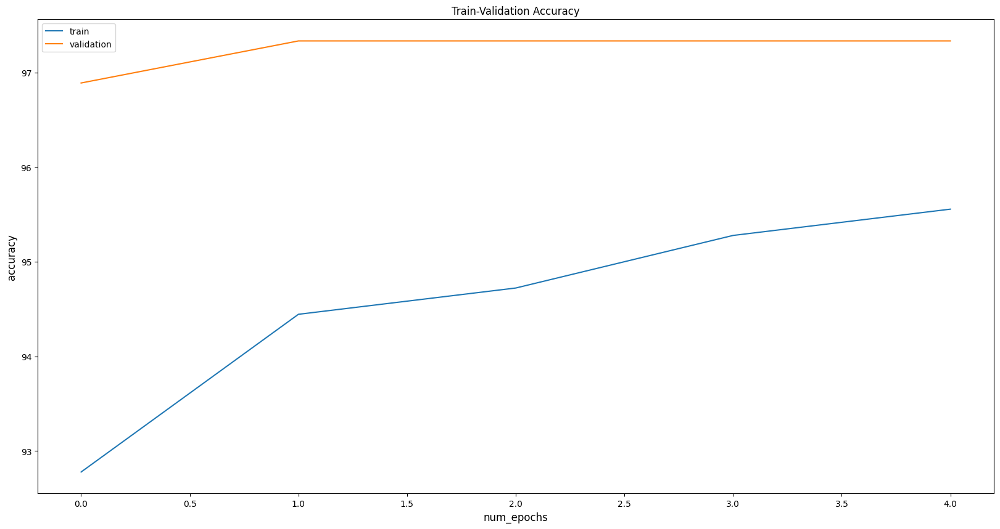

In [53]:
fig = plt.figure(figsize=(20,10))
plt.title("Train-Validation Accuracy")
plt.plot(train_acc, label='train')
plt.plot(val_acc, label='validation')
plt.xlabel('num_epochs', fontsize=12)
plt.ylabel('accuracy', fontsize=12)
plt.legend(loc='best')

In [54]:
test_model(net, test_dl=test_dl)

Test Accuracy: 97.33%
